# Exploratory Data Analysis of Telecom Data

### Extracting the data 

In [1]:
import pandas as pd 
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances, manhattan_distances

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline 

In [3]:
import seaborn as sns

In [4]:
import warnings
warnings.filterwarnings("ignore")

In [5]:
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 1000000)

## Reading the dataset from S3-AWS

In [6]:
s3_link = 'https://s3.amazonaws.com/projex.dezyre.com/recommender-system-for-telecom-products/materials/Telecom_data.csv'
df = pd.read_csv(s3_link)

#### basic informative analysis
- shape
- head
- tail
- describe
- info
- isnull
- columns

In [7]:
df.shape

(653753, 74)

In [8]:
df.head(5)

,Customer ID,Month,Month of Joining,zip_code,Gender,Age,Married,Dependents,Number of Dependents,Location ID,Service ID,state,county,timezone,area_codes,country,latitude,longitude,roam_ic,roam_og,loc_og_t2t,loc_og_t2m,loc_og_t2f,loc_og_t2c,std_og_t2t,std_og_t2m,std_og_t2f,std_og_t2c,isd_og,spl_og,og_others,loc_ic_t2t,loc_ic_t2m,loc_ic_t2f,std_ic_t2t,std_ic_t2m,std_ic_t2f,std_ic_t2o,spl_ic,isd_ic,ic_others,total_rech_amt,total_rech_data,vol_4g,vol_5g,arpu_5g,arpu_4g,arpu,night_pck_user,fb_user,aug_vbc_5g,offer,Referred a Friend,Number of Referrals,Phone Service,Multiple Lines,Internet Service,Internet Type,Streaming Data Consumption,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Payment Method,Status ID,Satisfaction Score,Churn Category,Churn Reason,Customer Status,Churn Value
0,hthjctifkiudi0,1,1,71638,Female,36.000000,No,No,0.0,jeavwsrtakgq0,bfbrnsqreveeuafgps0,AR,Chicot County,America/Chicago,870,US,33.52,-91.43,18.88,78.59,280.32,30.970000,5.71,1.79,25.71,175.56,0.47000,0,5.11,0.65,13.99,121.51,168.40,67.61,115.69,52.22,18.71,0,0.26,11.53,46.42,18,NaN,38.30,219.25,Not Applicable,Not Applicable,273.07,NaN,NaN,214.99,A,Yes,9.0,Yes,Yes,Yes,DSL,27,No,No,Yes,Yes,No,Yes,Yes,Yes,Credit Card,vvhwtmkbxtvsppd52013,3,Competitor,Competitor offered higher download speeds,Churned,1
1,uqdtniwvxqzeu1,6,6,72566,Male,36.472065,No,No,0.0,qcvetdmalnkw1,tkqnsqflrdatnqapsh1,AR,Izard County,America/Chicago,870,US,36.22,-92.08,69.46,72.08,255.73,148.800000,30.00,7.61,308.29,265.20,10.82000,0,1.23,905.51,1.69,212.93,155.19,29.04,9.15,38.89,0.84,0,0.05,32.51,25.53,1183,0.0,0.00,0.00,0,0,-329.96,0.0,1.0,0.00,F,No,0.0,Yes,Yes,No,NaN,14,No,Yes,No,No,Yes,No,No,No,Bank Withdrawal,jucxaluihiluj82863,4,Not Applicable,Not Applicable,Stayed,0
2,uqdtniwvxqzeu1,7,6,72566,Male,36.442687,No,No,0.0,qcvetdmalnkw1,tkqnsqflrdatnqapsh1,AR,Izard County,America/Chicago,870,US,36.22,-92.08,1012.60,115.26,52.95,1152.484282,103.28,15.71,244.20,15.19,61.84549,0,13.14,455.15,115.63,121.80,699.39,44.49,83.59,914.70,13.25,0,0.06,13.05,5.62,295,7.0,14.83,967.95,-9.4,106.3,101.22,1.0,1.0,85.87,No Offer,Yes,6.0,Yes,No,Yes,Cable,82,No,No,Yes,No,Yes,No,No,Yes,Credit Card,vjskkxphumfai57182,3,Not Applicable,Not Applicable,Stayed,0
3,uqdtniwvxqzeu1,8,6,72566,Male,36.837888,No,No,0.0,qcvetdmalnkw1,tkqnsqflrdatnqapsh1,AR,Izard County,America/Chicago,870,US,36.22,-92.08,84.18,99.85,140.51,4006.990000,280.86,6.33,346.14,103.15,183.53000,0,33.88,495.60,14.01,658.96,195.02,144.11,50.18,2.35,623.94,0,0.07,69.13,10.62,354,1.0,264.90,268.11,-5.15,77.53,215.48,0.0,1.0,268.38,J,Yes,10.0,Yes,No,Yes,Fiber Optic,57,No,No,Yes,No,Yes,No,No,Yes,Wallet Balance,cdwbcrvylqca53109,4,Not Applicable,Not Applicable,Stayed,0
4,uqdtniwvxqzeu1,9,6,72566,Male,36.490214,No,No,0.0,qcvetdmalnkw1,tkqnsqflrdatnqapsh1,AR,Izard County,America/Chicago,870,US,36.22,-92.08,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.00,0.00000,0,0.00,0.00,0.00,138.85,201.92,19.89,15.91,23.78,16.01,0,0.03,64.35,36.18,0,NaN,52.78,370.59,Not Applicable,Not Applicable,636.55,NaN,NaN,399.84,No Offer,Yes,1.0,No,No,Yes,Fiber Optic,38,No,No,No,No,No,Yes,No,Yes,Credit Card,whqrmeulitfj98550,1,Not Applicable,Not Applicable,Stayed,0


In [9]:
df.tail(5)

,Customer ID,Month,Month of Joining,zip_code,Gender,Age,Married,Dependents,Number of Dependents,Location ID,Service ID,state,county,timezone,area_codes,country,latitude,longitude,roam_ic,roam_og,loc_og_t2t,loc_og_t2m,loc_og_t2f,loc_og_t2c,std_og_t2t,std_og_t2m,std_og_t2f,std_og_t2c,isd_og,spl_og,og_others,loc_ic_t2t,loc_ic_t2m,loc_ic_t2f,std_ic_t2t,std_ic_t2m,std_ic_t2f,std_ic_t2o,spl_ic,isd_ic,ic_others,total_rech_amt,total_rech_data,vol_4g,vol_5g,arpu_5g,arpu_4g,arpu,night_pck_user,fb_user,aug_vbc_5g,offer,Referred a Friend,Number of Referrals,Phone Service,Multiple Lines,Internet Service,Internet Type,Streaming Data Consumption,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Payment Method,Status ID,Satisfaction Score,Churn Category,Churn Reason,Customer Status,Churn Value
653748,ksdlqrgoihlmp162977,8,6,98932,Female,22.0,Yes,No,0.0,nxoadzllyxzg162977,bxpevtcjeectllyrdt162977,WA,Yakima County,America/Los_Angeles,509,US,46.32,-120.15,45.00,0.00,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0,0.00,0.00,0.00,3990.18,2121.43,969.35,19.41,1050.93,122.57,0,0.11,41.57,54.13,0,12.0,20.31,16227.68,1098.84,793.17,195.90,0.0,1.0,242.51,No Offer,Yes,9.0,No,No,Yes,NaN,67,No,No,Yes,No,No,Yes,Yes,Yes,Bank Withdrawal,cgkwzaqcctmn82402,3,Not Applicable,Not Applicable,Stayed,0
653749,ksdlqrgoihlmp162977,9,6,98932,Female,22.0,Yes,No,0.0,nxoadzllyxzg162977,bxpevtcjeectllyrdt162977,WA,Yakima County,America/Los_Angeles,509,US,46.32,-120.15,9.77,62.58,51.17,366.40,1.48,12.160000,365.42,128.61,8.21,0,32.35,23.44,30.17,26.70,69.91,45.69,41.93,14.31,23.27,0,0.02,70.42,36.95,267,2.0,3.10,217.40,101.26,99.67,310.83,0.0,1.0,68.94,No Offer,Yes,1.0,Yes,NaN,Yes,NaN,84,No,Yes,No,No,Yes,No,Yes,Yes,Wallet Balance,snzcbrohetar69724,4,Not Applicable,Not Applicable,Stayed,0
653750,ksdlqrgoihlmp162977,10,6,98932,Female,22.0,Yes,No,0.0,nxoadzllyxzg162977,bxpevtcjeectllyrdt162977,WA,Yakima County,America/Los_Angeles,509,US,46.32,-120.15,329.80,79.84,45.18,192.32,5.97,281.580000,190.72,219.40,5.67,0,6.73,26.69,12.82,126.08,367.51,14.29,75.43,35.22,13.98,0,0.09,9.42,14.96,5527,0.0,0.00,0.00,0,0,163.20,1.0,NaN,0.00,B,Yes,11.0,Yes,Yes,No,NaN,0,Yes,No,No,No,No,No,No,No,Credit Card,girqesisbhkca38142,2,Not Applicable,Not Applicable,Stayed,0
653751,ksdlqrgoihlmp162977,11,6,98932,Female,22.0,Yes,No,0.0,nxoadzllyxzg162977,bxpevtcjeectllyrdt162977,WA,Yakima County,America/Los_Angeles,509,US,46.32,-120.15,277.29,24.29,303.62,197.00,3.33,20.389696,162.19,200.57,8.61,0,35.87,2.46,0.88,93.52,284.86,50.67,23.32,1404.82,13.64,0,0.06,40.32,41.48,286,0.0,0.00,0.00,0,0,924.07,NaN,NaN,0.00,No Offer,Yes,9.0,Yes,Yes,No,NaN,28,No,Yes,No,Yes,No,Yes,Yes,No,Bank Withdrawal,daplvxnhhqjt35633,3,Not Applicable,Not Applicable,Stayed,0
653752,ksdlqrgoihlmp162977,12,6,98932,Female,22.0,Yes,No,0.0,nxoadzllyxzg162977,bxpevtcjeectllyrdt162977,WA,Yakima County,America/Los_Angeles,509,US,46.32,-120.15,40.53,121.47,290.16,12.41,10.39,1.740000,347.15,177.04,9.83,0,10.70,5.05,5.10,194.15,331.60,1847.90,119.09,4.81,2.29,0,0.12,78.25,43.14,594,0.0,0.00,254687.00,0,0,346.56,NaN,NaN,0.00,No Offer,Yes,11.0,Yes,Yes,No,NaN,0,No,No,No,No,No,No,No,No,Credit Card,bwaebkwmzbxs93643,1,Support,Attitude of support person,Churned,1


In [10]:
df.describe()

,Month,Month of Joining,zip_code,Age,Number of Dependents,latitude,longitude,roam_ic,roam_og,loc_og_t2t,loc_og_t2m,loc_og_t2f,loc_og_t2c,std_og_t2t,std_og_t2m,std_og_t2f,std_og_t2c,isd_og,spl_og,og_others,loc_ic_t2t,loc_ic_t2m,loc_ic_t2f,std_ic_t2t,std_ic_t2m,std_ic_t2f,std_ic_t2o,spl_ic,isd_ic,ic_others,total_rech_amt,total_rech_data,vol_4g,vol_5g,arpu,night_pck_user,fb_user,aug_vbc_5g,Number of Referrals,Streaming Data Consumption,Satisfaction Score,Churn Value
count,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.0,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.0,653753.000000,653753.000000,653753.000000,653753.000000,443849.000000,653753.000000,653753.000000,653753.000000,280650.000000,243359.000000,653753.000000,653753.000000,653753.000000,653753.000000,653753.000000
mean,9.508209,5.823574,90386.180128,36.627306,1.161315,37.652731,-114.392353,249.650062,267.554526,834.627907,678.555093,32.269235,30.328622,577.609175,441.073443,34.878531,0.0,49.607952,88.964193,98.301149,846.741273,720.747069,330.918680,369.433263,306.379408,125.712469,0.0,0.251306,251.280851,144.004213,1687.052445,4.852747,192.096023,7967.055649,781.196280,0.217638,0.795796,530.525621,4.337965,27.574284,3.131712,0.045682
std,3.298742,2.855148,8412.506653,12.168730,2.245762,4.687151,10.537540,424.617016,625.610117,1589.595058,1112.490535,59.016877,67.610983,1306.899719,990.214161,57.920941,0.0,113.245522,168.699998,161.822511,1216.215767,1009.686119,483.251341,631.201630,437.613149,185.826000,0.0,0.438407,442.322772,293.132705,2980.015423,8.319981,592.101187,36093.904463,1807.269437,0.412640,0.403120,1402.826168,3.768386,26.349552,1.249076,0.208796
min,1.000000,1.000000,71601.000000,19.000000,0.000000,31.790000,-124.630000,-25.506563,-109.250816,-31.570579,0.000000,-6.975713,0.000000,0.000000,0.000000,-2.193700,0.0,0.000000,-42.425137,-12.746303,0.000000,0.000000,0.000000,-41.100527,0.000000,0.000000,0.0,0.000000,-49.675211,-58.302931,0.000000,0.000000,0.000000,0.000000,-2258.680000,0.000000,0.000000,-374.893876,0.000000,0.000000,1.000000,0.000000
25%,7.000000,3.000000,88424.000000,28.000000,0.000000,34.140000,-121.650000,12.090000,14.710000,32.700000,26.260000,1.460000,1.610000,33.120000,25.560000,1.200000,0.0,3.250000,4.940000,3.430000,85.570000,84.170000,36.110000,42.460000,32.190000,12.460000,0.0,0.040000,26.980000,20.330000,72.000000,0.000000,0.000000,0.000000,118.940000,0.000000,1.000000,0.000000,0.000000,2.000000,3.000000,0.000000
50%,10.000000,6.000000,93032.000000,34.000000,0.000000,36.080000,-118.390000,50.560000,75.100000,171.330000,135.460000,7.800000,8.180000,174.600000,134.800000,6.340000,0.0,17.190000,25.580000,17.830000,171.490000,168.390000,72.060000,84.470000,64.760000,24.980000,0.0,0.080000,53.700000,40.540000,374.000000,0.000000,47.010000,362.380000,348.540000,0.000000,1.000000,117.320000,4.000000,20.000000,3.000000,0.000000
75%,12.000000,8.000000,95551.000000,43.000000,1.000000,38.600000,-108.800000,162.030000,135.280000,309.090000,618.210000,14.090000,14.700000,316.240000,244.490000,36.640000,0.0,31.140000,46.190000,106.790000,1259.270000,1090.065814,496.790000,126.270000,448.830000,186.710000,0.0,0.210000,80.370000,60.730000,1089.000000,7.000000,154.900000,964.720000,580.650000,0.000000,1.000000,311.750000,8.000000,49.000000,4.000000,0.000000
max,14.000000,12.000000,99403.000000,80.000000,9.000000,48.990000,-89.740000,1719.430000,3161.780000,6431.250000,4212.010000,283.530000,336.130000,7366.160000,5622.540000,217.440000,0.0,765.050000,1020.710000,609.800000,4363.950000,3847.169616,1872.340000,2527.070000,1619.680000,663.930000,0.0,2.330000,1917.369911,1344.130000,11900.000000,32.000000,4503.930000,254687.000000,9394.500000,1.000000,1.000000,8214.870000,11.000000,85.000

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 653753 entries, 0 to 653752
Data columns (total 74 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Customer ID                 653753 non-null  object 
 1   Month                       653753 non-null  int64  
 2   Month of Joining            653753 non-null  int64  
 3   zip_code                    653753 non-null  int64  
 4   Gender                      653753 non-null  object 
 5   Age                         653753 non-null  float64
 6   Married                     653753 non-null  object 
 7   Dependents                  653753 non-null  object 
 8   Number of Dependents        653753 non-null  float64
 9   Location ID                 653753 non-null  object 
 10  Service ID                  653753 non-null  object 
 11  state                       653753 non-null  object 
 12  county                      653753 non-null  object 
 13  timezone      

In [12]:
df.isnull().sum()

Customer ID                        0
Month                              0
Month of Joining                   0
zip_code                           0
Gender                             0
Age                                0
Married                            0
Dependents                         0
Number of Dependents               0
Location ID                        0
Service ID                         0
state                              0
county                             0
timezone                           0
area_codes                         0
country                            0
latitude                           0
longitude                          0
roam_ic                            0
roam_og                            0
loc_og_t2t                         0
loc_og_t2m                         0
loc_og_t2f                         0
loc_og_t2c                         0
std_og_t2t                         0
std_og_t2m                         0
std_og_t2f                         0
s

In [13]:
df.columns

Index(['Customer ID', 'Month', 'Month of Joining', 'zip_code', 'Gender', 'Age',
       'Married', 'Dependents', 'Number of Dependents', 'Location ID',
       'Service ID', 'state', 'county', 'timezone', 'area_codes', 'country',
       'latitude', 'longitude', 'roam_ic', 'roam_og', 'loc_og_t2t',
       'loc_og_t2m', 'loc_og_t2f', 'loc_og_t2c', 'std_og_t2t', 'std_og_t2m',
       'std_og_t2f', 'std_og_t2c', 'isd_og', 'spl_og', 'og_others',
       'loc_ic_t2t', 'loc_ic_t2m', 'loc_ic_t2f', 'std_ic_t2t', 'std_ic_t2m',
       'std_ic_t2f', 'std_ic_t2o', 'spl_ic', 'isd_ic', 'ic_others',
       'total_rech_amt', 'total_rech_data', 'vol_4g', 'vol_5g', 'arpu_5g',
       'arpu_4g', 'arpu', 'night_pck_user', 'fb_user', 'aug_vbc_5g', 'offer',
       'Referred a Friend', 'Number of Referrals', 'Phone Service',
       'Multiple Lines', 'Internet Service', 'Internet Type',
       'Streaming Data Consumption', 'Online Security', 'Online Backup',
       'Device Protection Plan', 'Premium Tech Support', '

### Observation:-
- thier are some null values in the dataset so we will catch on later on
- arpu_5g & arpu_4g is in object that we have to change the data type 

## **Data Dictionary**



| Column name	 | Description|
| ----- | ----- |
| Customer ID	 | Unique identifier for each customer |
| Month | Calendar Month- 1:12 | 
| Month of Joining |	Calender Month -1:14, Month for which the data is captured|
| zip_code |	Zip Code|
|Gender |	Gender|
| Age |	Age(Years)|
| Married |	Marital Status |
|Dependents | Dependents - Binary |
| Number of Dependents |	Number of Dependents|
|Location ID |	Location ID|
|Service ID	 |Service ID|
|state|	State|
|county	|County|
|timezone	|Timezone|
|area_codes|	Area Code|
|country	|Country|
|latitude|	Latitude|
|longitude	|Longitude|
|arpu|	Average revenue per user|
|roam_ic	|Roaming incoming calls in minutes|
|roam_og	|Roaming outgoing calls in minutes|
|loc_og_t2t|	Local outgoing calls within same network in minutes|
|loc_og_t2m	|Local outgoing calls outside network in minutes(outside same + partner network)|
|loc_og_t2f|	Local outgoing calls with Partner network in minutes|
|loc_og_t2c	|Local outgoing calls with Call Center in minutes|
|std_og_t2t|	STD outgoing calls within same network in minutes|
|std_og_t2m|	STD outgoing calls outside network in minutes(outside same + partner network)|
|std_og_t2f|	STD outgoing calls with Partner network in minutes|
|std_og_t2c	|STD outgoing calls with Call Center in minutes|
|isd_og|	ISD Outgoing calls|
|spl_og	|Special Outgoing calls|
|og_others|	Other Outgoing Calls|
|loc_ic_t2t|	Local incoming calls within same network in minutes|
|loc_ic_t2m|	Local incoming calls outside network in minutes(outside same + partner network)|
|loc_ic_t2f	|Local incoming calls with Partner network in minutes|
|std_ic_t2t	|STD incoming calls within same network in minutes|
|std_ic_t2m	|STD incoming calls outside network in minutes(outside same + partner network)|
|std_ic_t2f|	STD incoming calls with Partner network in minutes|
|std_ic_t2o|	STD incoming calls operators other networks in minutes|
|spl_ic|	Special Incoming calls in minutes|
|isd_ic|	ISD Incoming calls in minutes|
|ic_others|	Other Incoming Calls|
|total_rech_amt|	Total Recharge Amount in Local Currency|
|total_rech_data|	Total Recharge Amount for Data in Local Currency
|vol_4g|	4G Internet Used in GB|
|vol_5g|	5G Internet used in GB|
|arpu_5g|	Average revenue per user over 5G network|
|arpu_4g|	Average revenue per user over 4G network|
|night_pck_user|	Is Night Pack User(Specific Scheme)|
|fb_user|	Social Networking scheme|
|aug_vbc_5g|	Volume Based cost for 5G network (outside the scheme paid based on extra usage)|
|offer|	Offer Given to User|
|Referred a Friend|	Referred a Friend : Binary|
|Number of Referrals|	Number of Referrals|
|Phone Service|	Phone Service: Binary|
|Multiple Lines|	Multiple Lines for phone service: Binary|
|Internet Service|	Internet Service: Binary|
|Internet Type|	Internet Type|
|Streaming Data Consumption|	Streaming Data Consumption|
|Online Security|	Online Security|
|Online Backup|	Online Backup|
|Device Protection Plan|	Device Protection Plan|
|Premium Tech Support|	Premium Tech Support|
|Streaming TV|	Streaming TV|
|Streaming Movies|	Streaming Movies|
|Streaming Music|	Streaming Music|
|Unlimited Data|	Unlimited Data|
|Payment Method|	Payment Method|
|Status ID|	Status ID|
|Satisfaction Score|	Satisfaction Score|
|Churn Category|	Churn Category|
|Churn Reason|	Churn Reason|
|Customer Status|	Customer Status|
|Churn Value|	Binary Churn Value



In [14]:
# lets see the unique in the feature average revenu per user in the 4g & 5g
print(df['arpu_4g'].unique())
print(df['arpu_5g'].unique())

['Not Applicable' '0' '106.3' ... '2573.06' '1092.62' '1847.93']
['Not Applicable' '0' '-9.4' ... '202.88' '120.33' '8566.079082']


##### observation:- It seems both the columns have value as Not Applicable resulting in the different datatype than expected. We will deal with this later.

##### offers:- lets see how many different offeres we have

In [15]:
df['offer'].unique()

array(['A', 'F', 'No Offer', 'J', 'E', 'C', 'I', 'B', 'D', 'H', 'G'],
      dtype=object)

##### so we had 10 different offers

In [16]:
df.columns

Index(['Customer ID', 'Month', 'Month of Joining', 'zip_code', 'Gender', 'Age',
       'Married', 'Dependents', 'Number of Dependents', 'Location ID',
       'Service ID', 'state', 'county', 'timezone', 'area_codes', 'country',
       'latitude', 'longitude', 'roam_ic', 'roam_og', 'loc_og_t2t',
       'loc_og_t2m', 'loc_og_t2f', 'loc_og_t2c', 'std_og_t2t', 'std_og_t2m',
       'std_og_t2f', 'std_og_t2c', 'isd_og', 'spl_og', 'og_others',
       'loc_ic_t2t', 'loc_ic_t2m', 'loc_ic_t2f', 'std_ic_t2t', 'std_ic_t2m',
       'std_ic_t2f', 'std_ic_t2o', 'spl_ic', 'isd_ic', 'ic_others',
       'total_rech_amt', 'total_rech_data', 'vol_4g', 'vol_5g', 'arpu_5g',
       'arpu_4g', 'arpu', 'night_pck_user', 'fb_user', 'aug_vbc_5g', 'offer',
       'Referred a Friend', 'Number of Referrals', 'Phone Service',
       'Multiple Lines', 'Internet Service', 'Internet Type',
       'Streaming Data Consumption', 'Online Security', 'Online Backup',
       'Device Protection Plan', 'Premium Tech Support', '

In [17]:
# lets take a look on offers distributions
dfg = df.groupby('offer').agg({'Customer ID':'count'}).reset_index()
dfg['% Total'] = dfg['Customer ID']/dfg['Customer ID'].sum()    # this creates a % of total column
dfg['% Total'] = dfg['% Total'].apply(lambda x: "{:.2}".format(x)) # this function simply formats the column to %
dfg #this displays the dataframe

,offer,Customer ID,% Total
0,A,15915,0.024
1,B,15871,0.024
2,C,16153,0.025
3,D,16162,0.025
4,E,15833,0.024
5,F,15789,0.024
6,G,15778,0.024
7,H,15855,0.024
8,I,15860,0.024
9,J,15893,0.024


**Observation**
* The Offers seems to be evenly distributed amongst customers
* There are about 76% users who did not receive any offer from the company


**Think about it**

* Is there any way to check impact of offers on churn? 
* How many customer churned as they were not given any offer?

In [18]:
# Lets see the distribution of offer and churn distribution
df['Customer Status'].unique()


array(['Churned', 'Stayed'], dtype=object)

In [19]:
dfg2 = df.groupby(['offer','Customer Status']).agg({'Customer ID':'count'}).reset_index()
pivoted_dfg2 = dfg2.pivot(index='offer',columns='Customer Status',values='Customer ID')
pivoted_dfg2 = pivoted_dfg2.reset_index()
pivoted_dfg2['Churn Rate'] = pivoted_dfg2['Churned']/(pivoted_dfg2['Churned'] + pivoted_dfg2['Stayed'])
pivoted_dfg2['Churn Rate'] = pivoted_dfg2['Churn Rate'].apply(lambda x: '{:.2%}'.format(x)) #this function simply formats the column to %
pivoted_dfg2


Customer Status,offer,Churned,Stayed,Churn Rate
0,A,1464,14451,9.20%
1,B,1441,14430,9.08%
2,C,1470,14683,9.10%
3,D,1484,14678,9.18%
4,E,1418,14415,8.96%
5,F,1459,14330,9.24%
6,G,1409,14369,8.93%
7,H,1477,14378,9.32%
8,I,1468,14392,9.26%
9,J,1483,14410,9.33%


**Observations**

* churn rate seems to be similar amongst customers regardless of the offer they received -> this tells us that maybe offers are not being tailored enough to groups


In [20]:
# taking alook on the churn category
dfg2 = df.groupby(['Churn Category']).agg({'Customer ID':'count'}).reset_index()
dfg2['% Total'] = dfg2['Customer ID']/dfg2['Customer ID'].sum()
dfg2['% Total'] = dfg2['% Total'].apply(lambda x: '{:.2%}'.format(x))
dfg2

,Churn Category,Customer ID,% Total
0,Attitude,296,0.05%
1,Competitor,5974,0.91%
2,Dissatisfaction,6001,0.92%
3,Not Applicable,622748,95.26%
4,Other,4356,0.67%
5,Price,4381,0.67%
6,Support,7538,1.15%
7,Unknown,1269,0.19%
8,bcvjhdjcb,1190,0.18%


**Observations**

* The Churn Category for Competitor, Dissatisfaction, Price, Support have higher customers
* We can give them specific offers which may lead them to stay rather than churning


**Think about it**

* Is there any better way to recommend offers to customers which can impact less churn rate in future?
* It would be interesting to see what happens if we tailor offers by looking at churn probability for each customer(May be a problem to solve in our next project)

# Data Processing

## **Missing Value Detection and Imputation**

We previously saw there are some missing values in the data. Lets have a look into that now.

In [21]:
# lets see  the null values with the dataframe
percentage_missing = df.isnull().sum()/len(df)
missing_value_df = pd.DataFrame({"column_name" : df.columns,
                                "percent_missing" : percentage_missing.values})
# sorting the dataframe to percent missing value
missing_value_df.sort_values(by='percent_missing', ascending=False)

,column_name,percent_missing
49,fb_user,0.627751
48,night_pck_user,0.570709
57,Internet Type,0.497512
42,total_rech_data,0.321075
55,Multiple Lines,0.070485
66,Unlimited Data,0.016983
47,arpu,0.000000
53,Number of Referrals,0.000000
52,Referred a Friend,0.000000
51,offer,0.000000


**Observation**



*  Columns 'fb_user' and 'night_pck_user' have more 50% missing value. We will simply drop this from our dataframe
* According to data dictionary 'Internet Type' and 'total_rech_data' seems to correlated.
*   We need to check for columns 'Internet Type' and 'total_rech_data' and impute missing values if possible




In [22]:
df = df.drop(columns=['fb_user','night_pck_user'])

In [23]:
df.shape

(653753, 72)

In [24]:
# Null values in total recharge data
df['total_rech_data'].isna().sum()

209904

In [25]:
# Null values in Internet Type
df['Internet Type'].isna().sum()

325250

**Observation:**

*  These missing values may represent customers who have not recharged their account or have recharged but the information has not been recorded.

* It is possible that customers with missing recharge data are those who received free data service, and therefore did not need to recharge their account. Alternatively, it is possible that the missing values are due to technical issues, such as data recording errors or system failures.

In [26]:
# Checking the value counts of Internet Service where total recharge data was null
df[df['total_rech_data'].isna()]['Internet Service'].value_counts(dropna=False)

Internet Service
Yes    209904
Name: count, dtype: int64

In [27]:
df['Internet Service'].value_counts()

Internet Service
Yes    398863
No     254890
Name: count, dtype: int64

**Observation**:

* It turns out that all customers with missing recharge data have opted for internet service, the next step could be to check if they have used it or not.

In [28]:
df.columns

Index(['Customer ID', 'Month', 'Month of Joining', 'zip_code', 'Gender', 'Age',
       'Married', 'Dependents', 'Number of Dependents', 'Location ID',
       'Service ID', 'state', 'county', 'timezone', 'area_codes', 'country',
       'latitude', 'longitude', 'roam_ic', 'roam_og', 'loc_og_t2t',
       'loc_og_t2m', 'loc_og_t2f', 'loc_og_t2c', 'std_og_t2t', 'std_og_t2m',
       'std_og_t2f', 'std_og_t2c', 'isd_og', 'spl_og', 'og_others',
       'loc_ic_t2t', 'loc_ic_t2m', 'loc_ic_t2f', 'std_ic_t2t', 'std_ic_t2m',
       'std_ic_t2f', 'std_ic_t2o', 'spl_ic', 'isd_ic', 'ic_others',
       'total_rech_amt', 'total_rech_data', 'vol_4g', 'vol_5g', 'arpu_5g',
       'arpu_4g', 'arpu', 'aug_vbc_5g', 'offer', 'Referred a Friend',
       'Number of Referrals', 'Phone Service', 'Multiple Lines',
       'Internet Service', 'Internet Type', 'Streaming Data Consumption',
       'Online Security', 'Online Backup', 'Device Protection Plan',
       'Premium Tech Support', 'Streaming TV', 'Streaming Mov

In [29]:
df[df['total_rech_data'].isna()]['Unlimited Data'].value_counts()

Unlimited Data
Yes    181040
No      28864
Name: count, dtype: int64

In [30]:
# Lets check Average Revenue for 4g and 5g when there is no recharge for data
df[(df['total_rech_data'].isna())][['arpu_4g','arpu_5g']].value_counts()

arpu_4g         arpu_5g       
Not Applicable  Not Applicable    195182
297.57          8530.983629            4
544.17          8536.565906            3
395.94          8533.210427            3
290.09          8530.814304            3
660.07          8539.18953             3
1942.98         8568.230726            3
304.65          8531.143898            3
1850.89         8566.146087            3
422.42          8533.809854            3
1811.33         8565.250569            3
1849.55         8566.115754            3
404.21          8533.397635            3
318.68          8531.461495            3
380.34          8532.857291            3
1917.43         8567.652351            3
1885.23         8566.923441            3
340.76          8531.961319            3
355.69          8532.299289            3
577.04          8537.309983            3
455.97          8534.569325            3
1921.5          8567.744484            3
1826.59         8565.596009            2
338.5           8531.91016

**Observation**:

* We can fill the missing values in the total_rech_data column with 0 when the arpu (Average Revenue Per User) is `not applicable`. This is because the arpu is a measure of the revenue generated per user, and if it is not applicable, it may indicate that the user is not generating any revenue for the company. In such cases, it is reasonable to assume that the total data recharge amount is 0
* It is advisable to check with the business before making this decision 

In [31]:
df.loc[(df['arpu_4g'] == 'Not Applicable') | (df['arpu_5g'] == 'Not Applicable'), 'total_rech_data']=0


In [32]:
# lets check are they repplace or not
df['arpu_4g'].unique()

array(['Not Applicable', '0', '106.3', ..., '2573.06', '1092.62',
       '1847.93'], dtype=object)

In [33]:
df['total_rech_data'].unique()
# it  has some nan values 

array([ 0.,  7.,  1.,  8., 19.,  2., 14.,  4., 12., 16.,  3., 27., 18.,
       23., nan, 26., 10., 24.,  5., 20., 30.,  9., 25., 29., 15., 11.,
       22., 31., 17., 21., 13., 32.,  6., 28.])

In [34]:
df['total_rech_data'].isna().sum()
# total null values is 

14722

In [35]:
df['total_rech_data'].describe()

count    639031.000000
mean          3.370552
std           7.285264
min           0.000000
25%           0.000000
50%           0.000000
75%           2.000000
max          32.000000
Name: total_rech_data, dtype: float64

We cannot fill other values with 0 because they have some ARPU to consider.

In [36]:
# Calculate the mean of 'total_rech_data' where either 'arpu_4g' or 'arpu_5g' is not equal to 'Not Applicable'
arpu_data_mean=df.loc[(df['arpu_4g']!='Not Applicable') | (df['arpu_5g']!='Not Applicable'),'total_rech_data'].mean()
arpu_data_mean

4.85274721808543

In [37]:
df.columns

Index(['Customer ID', 'Month', 'Month of Joining', 'zip_code', 'Gender', 'Age',
       'Married', 'Dependents', 'Number of Dependents', 'Location ID',
       'Service ID', 'state', 'county', 'timezone', 'area_codes', 'country',
       'latitude', 'longitude', 'roam_ic', 'roam_og', 'loc_og_t2t',
       'loc_og_t2m', 'loc_og_t2f', 'loc_og_t2c', 'std_og_t2t', 'std_og_t2m',
       'std_og_t2f', 'std_og_t2c', 'isd_og', 'spl_og', 'og_others',
       'loc_ic_t2t', 'loc_ic_t2m', 'loc_ic_t2f', 'std_ic_t2t', 'std_ic_t2m',
       'std_ic_t2f', 'std_ic_t2o', 'spl_ic', 'isd_ic', 'ic_others',
       'total_rech_amt', 'total_rech_data', 'vol_4g', 'vol_5g', 'arpu_5g',
       'arpu_4g', 'arpu', 'aug_vbc_5g', 'offer', 'Referred a Friend',
       'Number of Referrals', 'Phone Service', 'Multiple Lines',
       'Internet Service', 'Internet Type', 'Streaming Data Consumption',
       'Online Security', 'Online Backup', 'Device Protection Plan',
       'Premium Tech Support', 'Streaming TV', 'Streaming Mov

With this mean, we will fill the NaN values.

In [38]:
df['total_rech_data']=df['total_rech_data'].fillna(arpu_data_mean)

In [39]:
df['total_rech_data'].isnull().sum()
# so null values over here

0

In [40]:
df['Internet Type'].unique()
# here is nan values present in the internet type

array(['DSL', nan, 'Cable', 'Fiber Optic'], dtype=object)

In [41]:
# chekcing the value count  is the  null for the internet servces
df[df['Internet Type'].isna()]['Internet Service'].value_counts()

Internet Service
No     236152
Yes     89098
Name: count, dtype: int64

All null values in Internet Type does not have Internet Service. Let's fill these null values with Not Applicable.

In [42]:
# so fill na values with not applicable
df['Internet Type'] = df['Internet Type'].fillna('Not Applicable')

In [43]:
df['Internet Type'].unique()

array(['DSL', 'Not Applicable', 'Cable', 'Fiber Optic'], dtype=object)

In [44]:
df['Internet Type'].unique()
# see we fill this with Not applicable

array(['DSL', 'Not Applicable', 'Cable', 'Fiber Optic'], dtype=object)

Replace 'Not Applicable' with 0 in both 'arpu_4g' and 'arpu_5g and convert them to float

In [45]:
df['arpu_4g'].unique()

array(['Not Applicable', '0', '106.3', ..., '2573.06', '1092.62',
       '1847.93'], dtype=object)

In [46]:
df['arpu_4g'] = df['arpu_4g'].replace('Not Applicable',0)
df['arpu_5g'] = df['arpu_5g'].replace('Not Applicable',0)

# converting into the float
df['arpu_4g'] = df['arpu_4g'].astype(float)
df['arpu_5g'] = df['arpu_5g'].astype(float)

So here we handled all the null values 
- we replaced null with mean 
- we replaced na values with not applicable
- we replaced not applicable with 0 values an convert it into the float

## **Outlier Detection and Imputation**


Outlier detection is a critical data analysis technique that involves identifying and removing data points that are significantly different from the rest of the data. Outliers are data points that lie far away from the rest of the data, and they can significantly influence the statistical analysis and machine learning models' performance. Therefore, identifying and removing outliers is essential to ensure accurate and reliable data analysis results.

There are two main approaches for outlier detection: parametric and non-parametric.

* Parametric Methods:
Parametric methods assume that the data follows a specific distribution, such as a normal distribution. In this approach, outliers are identified by calculating the distance of each data point from the mean of the distribution in terms of the number of standard deviations. Data points that are beyond a certain number of standard deviations (usually three or more) are considered as outliers.

One common parametric method is the Z-score method, which calculates the distance of each data point from the mean in terms of standard deviations.
Parametric methods can be useful when the data follows a known distribution, but they may not be effective when the data is not normally distributed.

* Non-Parametric Methods:
Non-parametric methods do not assume any specific distribution of the data. Instead, they rely on the rank or order of the data points. In this approach, outliers are identified by comparing the values of each data point with the values of other data points. Data points that are significantly different from other data points are considered as outliers.

Quantiles are an important concept in non-parametric outlier detection methods. They represent values that divide a dataset into equal-sized parts, such as quarters or thirds. The most commonly used quantiles are the median (which divides the data into two equal parts), the first quartile (which divides the data into the lowest 25% and the highest 75%), and the third quartile (which divides the data into the lowest 75% and the highest 25%).

The interquartile range (IQR) is another important concept related to quantiles. It is defined as the difference between the third and first quartiles and represents the middle 50% of the data. The IQR can be used to identify outliers by defining a range (known as the Tukey's fence) beyond which any data points are considered outliers.
Non-parametric methods can be useful when the data is not normally distributed or when the distribution is unknown.

In [47]:
# list of all numerical column
all_numeric_cols = [col for col in df.columns if df[col].dtype != 'O']
print(len(all_numeric_cols))

# list of all object columns
all_object_cols = [col for col in df.columns if df[col].dtype == 'O']
print(len(all_object_cols ))

42
30


In [48]:
df[all_numeric_cols].isnull().sum()
# no null values over here

Month                         0
Month of Joining              0
zip_code                      0
Age                           0
Number of Dependents          0
latitude                      0
longitude                     0
roam_ic                       0
roam_og                       0
loc_og_t2t                    0
loc_og_t2m                    0
loc_og_t2f                    0
loc_og_t2c                    0
std_og_t2t                    0
std_og_t2m                    0
std_og_t2f                    0
std_og_t2c                    0
isd_og                        0
spl_og                        0
og_others                     0
loc_ic_t2t                    0
loc_ic_t2m                    0
loc_ic_t2f                    0
std_ic_t2t                    0
std_ic_t2m                    0
std_ic_t2f                    0
std_ic_t2o                    0
spl_ic                        0
isd_ic                        0
ic_others                     0
total_rech_amt                0
total_re

In [49]:
# so we have to do the outlier handling what we are doing create empty datafame where we give indexing of quantiles
quantile_df = pd.DataFrame(columns= all_numeric_cols, index=[0.1,0.2,0.5,0.6,0.8,0.9,0.95,0.98,0.99])

# for each column in all_numeric_cols, calculate the corresponding quantiles and store them in the quantile_df
for col in all_numeric_cols:
 quantile_df[col]= df[col].quantile([0.1,0.2,0.5,0.6,0.8,0.9,0.95,0.98,0.99])

In [50]:
quantile_df

,Month,Month of Joining,zip_code,Age,Number of Dependents,latitude,longitude,roam_ic,roam_og,loc_og_t2t,loc_og_t2m,loc_og_t2f,loc_og_t2c,std_og_t2t,std_og_t2m,std_og_t2f,std_og_t2c,isd_og,spl_og,og_others,loc_ic_t2t,loc_ic_t2m,loc_ic_t2f,std_ic_t2t,std_ic_t2m,std_ic_t2f,std_ic_t2o,spl_ic,isd_ic,ic_others,total_rech_amt,total_rech_data,vol_4g,vol_5g,arpu_5g,arpu_4g,arpu,aug_vbc_5g,Number of Referrals,Streaming Data Consumption,Satisfaction Score,Churn Value
0.10,5.0,2.0,72460.0,24.000000,0.0,33.66,-122.45,0.000000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.0,0.000000,0.000000,0.0000,34.740000,33.790000,14.4600,16.950000,13.060000,5.030000,0.0,0.02,10.770000,8.100000,0.0,0.000000,0.0000,0.000,0.000000,0.000000,-256.2000,0.0000,0.0,0.0,1.0,0.0
0.20,7.0,3.0,87549.0,26.000000,0.0,34.03,-122.03,3.970000,2.3400,5.2700,4.124000,0.230000,0.260000,5.230000,3.980000,0.19,0.0,0.500000,0.820000,0.5600,68.640000,67.220000,29.0400,34.000000,25.790000,9.960000,0.0,0.03,21.630000,16.300000,11.0,0.000000,0.0000,0.000,0.000000,0.000000,72.8800,0.0000,0.0,0.0,2.0,0.0
0.50,10.0,6.0,93032.0,34.000000,0.0,36.08,-118.39,50.560000,75.1000,171.3300,135.460000,7.800000,8.180000,174.600000,134.800000,6.34,0.0,17.190000,25.580000,17.8300,171.490000,168.390000,72.0600,84.470000,64.760000,24.980000,0.0,0.08,53.700000,40.540000,374.0,0.000000,47.0100,362.380,0.000000,0.000000,348.5400,117.3200,4.0,20.0,3.0,0.0
0.60,11.0,7.0,94107.0,36.616114,0.0,37.28,-117.92,66.750000,99.3200,225.7500,179.690000,10.310000,10.800000,231.490000,178.290000,8.37,0.0,22.790000,33.900000,23.5200,205.960000,269.792000,86.6400,101.150000,77.830000,29.990000,0.0,0.10,64.520000,48.610000,495.0,0.000000,90.5100,612.730,0.000000,0.000000,441.4720,198.1300,5.0,29.0,3.0,0.0
0.80,13.0,9.0,95944.0,47.000000,2.0,39.74,-106.04,496.902000,146.8200,856.7660,1392.937844,43.870000,15.970000,344.970000,266.540000,71.61,0.0,33.910000,50.240000,229.2600,1999.693293,1471.752357,653.0360,543.193515,633.989756,275.199406,0.0,0.33,384.863930,64.800000,2197.0,4.852747,176.3600,3814.222,789.000000,783.290000,626.2300,350.4900,8.0,56.0,4.0,0.0
0.90,14.0,10.0,98383.0,55.000000,4.0,47.22,-92.83,969.043806,689.5980,3613.9960,2644.568000,126.593474,109.097149,1547.136000,1007.842370,143.14,0.0,113.178996,372.784695,382.7180,2974.581617,2424.826000,1198.6440,1525.978000,1030.569644,466.868000,0.0,0.71,1102.719792,532.378638,7013.0,14.000000,219.2680,12369.516,2219.752000,2224.100000,1901.5140,789.0000,10.0,69.0,5.0,0.0
0.95,14.0,10.0,98841.0,61.000000,7.0,47.66,-91.77,1283.198000,1954.3920,5079.8300,3479.438000,183.490000,207.514000,3953.108671,3108.617986,171.80,0.0,319.283936,470.114614,489.7000,3719.724000,3166.758000,1462.3020,2022.070000,1360.444000,569.740000,0.0,1.27,1443.993611,914.270000,9369.0,23.000000,663.2040,17358.418,8530.865147,8675.302558,5892.6180,3943.2100,11.0,77.0,5.0,0.0
0.98,14.0,11.0,99155.0,68.000000,8.0,48.15,-90.81,1576.290000,2829.3596,5990.1896,3908.389200,212.140000,295.159600,5973.547200,4537.390000,198.95,0.0,420.409200,607.101019,553.1196,4048.600000,3578.299600,1734.7700,2234.909600,1524.219200,614.489600,0.0,2.00,1578.470000,1289.700000,10956.0,27.000000,2802.2864,87978.000,87978.000000,87978.000000,7979.3472,6657.9876,11.0,82.0,5.0,1.0
0.99,14.0,12.0,99251.0,74.000000,9.0,48.59,-90.47,1646.899600,3041.7600,6191.2040,4060.298800,257.650000,311.464800,6729.403200,4875.216400,208.18,0.0,637.009600,836.140000,579.3748,4200.448800,3679.364400,1792.9848,2434.554800,1571.760000,639.000000,0.0,2.19,1601.920000,1317.510000,11367.0,30.000000,4289.8496,254687.000,254687.000000,254687.000000,8846.9584,7366.7684,11.0,83.0,5.0,1.0


# lets see BOX-PLOT by visualization

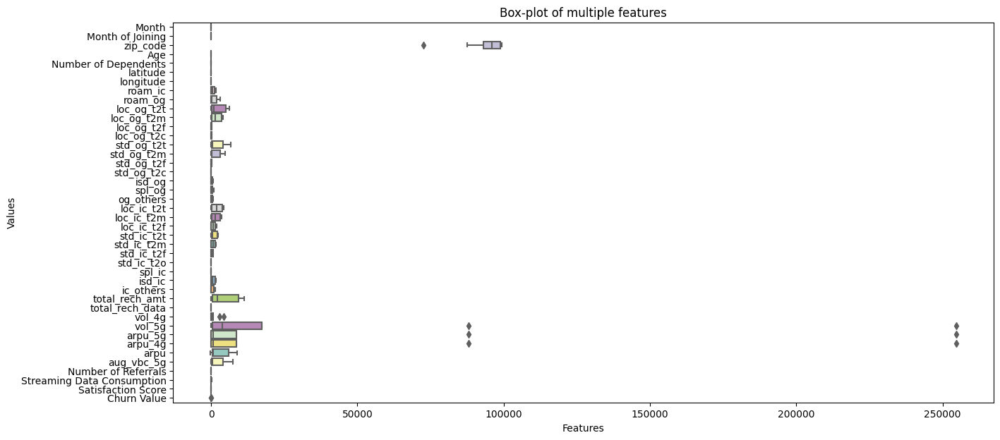

In [51]:
plt.figure(figsize=(15,7))
sns.boxplot(data=quantile_df, orient='h', palette='Set3')
plt.xlabel('Features')
plt.ylabel('Values')
plt.title('Box-plot of multiple features')
plt.show()


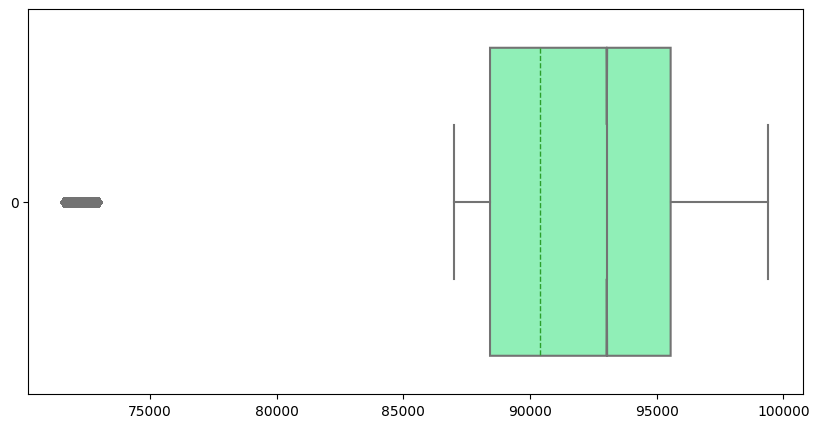

In [52]:
# lets see the zip code
plt.figure(figsize=(10,5))
sns.boxplot(data = df['zip_code'], palette='rainbow',notch=True, orient='h',whis=1.5, showmeans=True, meanline=True)
plt.show()

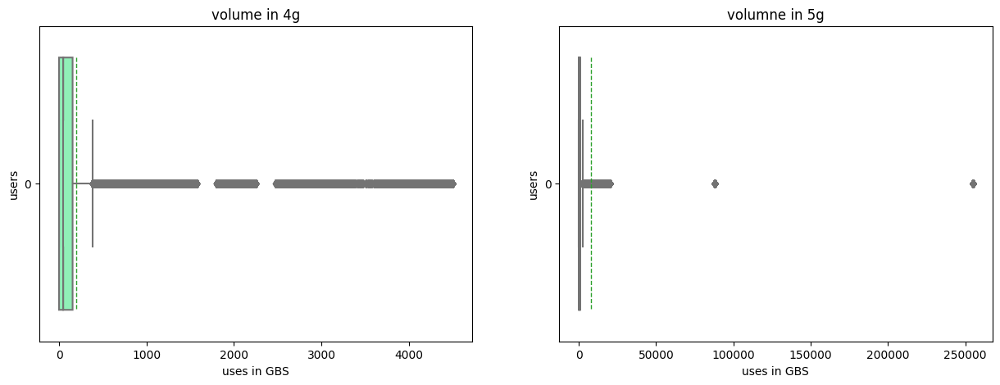

In [53]:
fig, axs = plt.subplots(1,2, figsize=(15,5))
plt.subplot(121)
sns.boxplot(data = df['vol_4g'],palette='rainbow',notch=True, orient='h',whis=1.5, showmeans=True, meanline=True)
plt.title('volume in 4g')
plt.xlabel('uses in GBS')
plt.ylabel('users')

plt.subplot(122)
sns.boxplot(data = df['vol_5g'],palette='rainbow',notch=True, orient='h',whis=1.5, showmeans=True, meanline=True)
plt.title('volumne in 5g')
plt.xlabel('uses in GBS')
plt.ylabel('users')
plt.show()

##### arpu_4g and 5g

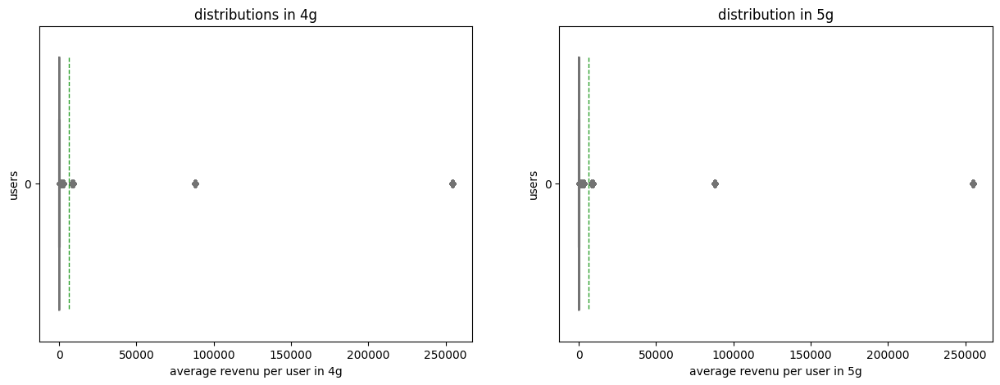

In [54]:
fig, axs = plt.subplots(2,2, figsize=(15,5))
plt.subplot(121)
sns.boxplot(data = df['arpu_4g'],palette='rainbow',notch=True, orient='h',whis=1.5, showmeans=True, meanline=True)
plt.title('distributions in 4g')
plt.xlabel('average revenu per user in 4g')
plt.ylabel('users')

plt.subplot(122)
sns.boxplot(data = df['arpu_5g'],palette='rainbow',notch=True, orient='h',whis=1.5, showmeans=True, meanline=True)
plt.title('distribution in 5g')
plt.xlabel('average revenu per user in 5g')
plt.ylabel('users')
plt.show()




Text(0, 0.5, 'users')

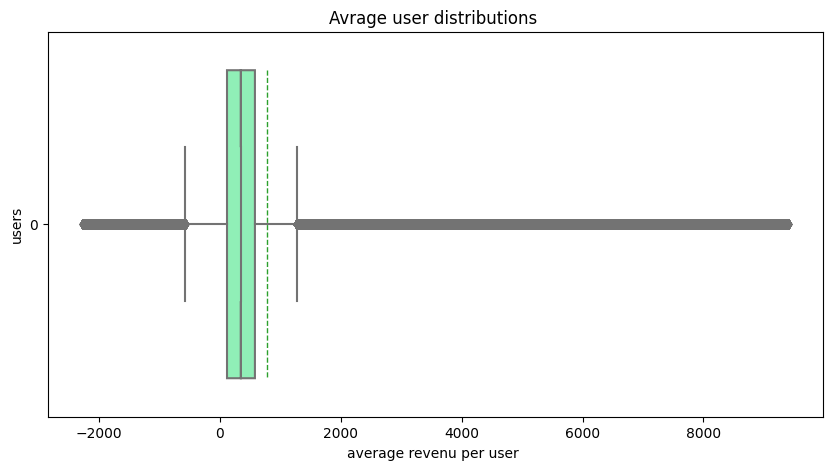

In [55]:
plt.figure(figsize=(10,5))
sns.boxplot(data = df['arpu'],palette='rainbow',notch=True, orient='h',whis=1.5, showmeans=True, meanline=True)
plt.title('Avrage user distributions ')
plt.xlabel('average revenu per user ')
plt.ylabel('users')

In [56]:
df['arpu'].value_counts()

arpu
 93.31      40
 145.87     39
 490.32     38
 260.52     38
 289.06     38
 169.60     37
 280.41     37
 387.20     37
 365.55     37
 95.73      37
 77.56      36
 542.94     36
 324.44     36
 382.83     36
 316.36     36
 332.66     36
 553.04     35
 440.30     35
 105.97     35
 455.31     35
 316.00     35
 138.97     35
 353.04     35
 389.00     34
 580.56     34
 494.17     34
 163.34     34
 95.61      33
 74.81      33
 194.38     33
 151.24     33
 367.08     33
 586.19     33
 557.01     33
 479.14     33
 620.43     33
 94.38      33
 406.60     33
 197.89     33
 548.44     33
 280.64     33
 164.56     33
 632.60     33
 539.80     33
 241.71     32
 540.24     32
 479.20     32
 480.03     32
 397.45     32
 412.36     32
 439.78     32
 139.45     32
 81.86      32
 587.57     32
 401.33     31
 433.86     31
 362.37     31
 263.25     31
 250.15     31
 385.49     31
 579.08     31
 646.92     31
 84.45      31
 475.99     31
 578.26     31
 92.73      31
 419.

**Observation**

The variables vol_5g, arpu_4g, and arpu_5g seems to have some abrupt values

**Note**

We can inquire about this values with business. Remember to check out with business stakeholders before making any changes/imputations to data.**Note**

We can inquire about this values with business. Remember to check out with business stakeholders before making any changes/imputations to data.

In [57]:
# Checking further
df['arpu_4g'].quantile([0.75,0.8,0.9,0.95,0.97,0.99,0.999])

0.750       228.220000
0.800       783.290000
0.900      2224.100000
0.950      8675.302558
0.970      8839.721689
0.990    254687.000000
0.999    254687.000000
Name: arpu_4g, dtype: float64

In [58]:
# Calculate the proportion of rows in the DataFrame where the value in the 'arpu_4g' column is equal to 254687
df[df['arpu_4g']==254687].shape[0]/df.shape[0]

0.019651152652454366

In [59]:
df['arpu_4g'].value_counts()

arpu_4g
 0.000000         411744
 63.000000         15364
 254687.000000     12847
 8839.721689        6533
 789.000000         5119
 87978.000000       5007
 128.000000           15
 67.690000            14
 11.970000            14
 74.170000            13
 41.570000            13
-3.550000             13
 109.590000           13
 125.780000           13
-7.240000             13
 43.460000            13
-0.050000             13
 25.820000            13
 64.850000            13
 87.150000            13
-6.010000             13
 126.490000           12
 85.940000            12
 86.680000            12
 124.220000           12
-4.480000             12
 83.620000            12
 117.720000           12
 111.550000           12
 107.980000           12
 113.850000           12
 40.180000            12
 10.490000            12
 57.940000            12
 113.440000           12
 91.990000            12
 14.550000            12
 29.340000            12
 86.760000            12
 127.280000      

Let's see what is the value of 'total_rech_data' for these observations.

In [60]:
# Get the value counts of 'total_rech_data' for observations where the value in the 'arpu_4g' column is equal to 254687
df[df['arpu_4g']==254687]['total_rech_data'].value_counts()

total_rech_data
0.0    12847
Name: count, dtype: int64

Now, since the recharge amount is 0 and there is no ARPU, let's replace it with 0.

In [61]:
df[df['arpu_4g'] == 254687]['total_rech_data'].values

array([0., 0., 0., ..., 0., 0., 0.])

In [62]:
df['arpu_4g'] = df['arpu_4g'].replace(254687,0)

In [63]:
df['arpu_4g'].describe()

count    653753.000000
mean       1195.675011
std        7770.596601
min         -10.470000
25%           0.000000
50%           0.000000
75%         120.570000
max       87978.000000
Name: arpu_4g, dtype: float64

In [64]:
# Checking further
df['arpu_4g'].quantile([0.75,0.8,0.9,0.95,0.97,0.99,0.999])

0.750      120.570000
0.800      504.112000
0.900     1893.758000
0.950     2493.880000
0.970     8675.470757
0.990     8839.721689
0.999    87978.000000
Name: arpu_4g, dtype: float64

In [65]:
# Filter by 'arpu_4g' value of 87978 and count unique values in 'total_rech_data' column
df[df['arpu_4g']==87978]['total_rech_data'].value_counts()

total_rech_data
0.0    5007
Name: count, dtype: int64

All rows in the dataframe with an 'arpu_4g' value of 87978 have 0 value in the 'total_rech_data' column, indicating that these are likely outliers. Therefore, we have decided to replace the 'arpu_4g' value for these rows with 0.

In [66]:
df['arpu_4g'] = df['arpu_4g'].replace(87978,0)

In [67]:
df['arpu_4g'].quantile([0.75,0.8,0.9,0.95,0.97,0.99,0.999])

0.750     107.760000
0.800     432.246000
0.900    1803.560000
0.950    2424.072000
0.970    2735.554400
0.990    8705.097343
0.999    8839.721689
Name: arpu_4g, dtype: float64

This seems to be fairly good now

In [68]:
# Get the value counts of 'total_rech_data' for observations where the value in the 'arpu_5g' column is equal to 87978
df[df['arpu_5g']==87978]['total_rech_data'].value_counts()

total_rech_data
0.0    5130
Name: count, dtype: int64

In [69]:
# Replacing the values with 0 where total recharge data is 0
df['arpu_5g']=df['arpu_5g'].replace([87978,254687],0)

In [70]:
# Check the quantiles of ARPU 5G
df['arpu_5g'].quantile([0.75,0.8,0.9,0.95,0.97,0.99,0.999])

0.750      96.490000
0.800     417.102000
0.900    1797.618000
0.950    2543.904000
0.970    2792.060000
0.990    8587.153966
0.999    8724.440600
Name: arpu_5g, dtype: float64

In [71]:
# Check the quantiles of Volume of 5G data
df['vol_5g'].quantile([0.75,0.8,0.9,0.95,0.97,0.98,0.99,0.999])

0.750       964.7200
0.800      3814.2220
0.900     12369.5160
0.950     17358.4180
0.970     19569.9704
0.980     87978.0000
0.990    254687.0000
0.999    254687.0000
Name: vol_5g, dtype: float64

In [72]:
# Lets see the recharge data value for vol_5g more than 87978
df[df['vol_5g']>=87978]['total_rech_data'].value_counts()

total_rech_data
0.0    18072
Name: count, dtype: int64

In [73]:
# Proportion of these values
df[df['vol_5g']>=87978]['total_rech_data'].value_counts()/df.shape[0]

total_rech_data
0.0    0.027643
Name: count, dtype: float64

**Observation**:

There is a presence of 2% outliers in vol 5g, where the values are very high, but their total recharge data is 0. We will fill these outliers with 0, and below are some possible reasons why this could be:

* Data recording error: It is possible that there was an error in recording the recharge data for these outliers, leading to an incorrect value of 0. In this case, it would make sense to fill the outliers with 0, as this is likely the correct value.

* Promotions or bonuses: Another possibility is that these customers received promotions or bonuses that allowed them to use the service without recharging, leading to a total recharge data of 0. However, these customers may still be using the service heavily, leading to the high values in vol 5g. In this case, filling the outliers with 0 would make sense as it accurately reflects the lack of recharge data.

In [74]:
# Replace the outlier values
df['vol_5g']=df['vol_5g'].replace([87978,254687],0)

In [75]:
# Check the quantiles of Volume of 5G data
df['vol_5g'].quantile([0.75,0.8,0.9,0.95,0.97,0.98,0.99,0.999])

0.750      895.8100
0.800     1654.5460
0.900     9658.3760
0.950    14517.6400
0.970    16580.3764
0.980    17551.8796
0.990    18614.5528
0.999    19746.1824
Name: vol_5g, dtype: float64

It seems good now

Lets store this processed data for further use.

In [76]:
df.to_csv('processed_telecom_offer_data.csv',index=False)

### **Data Preprocessing and Leakage**

Data leakage is a situation where information from the test or prediction data is inadvertently used during the training process of a machine learning model. This can occur when information from the test or prediction data is leaked into the training data, and the model uses this information to improve its performance during the training process.

Data leakage can occur during the preprocessing phase of machine learning when information from the test or prediction data is used to preprocess the training data, inadvertently leaking information from the test or prediction data into the training data.

For example, consider a scenario where the preprocessing step involves imputing missing values in the dataset. If the missing values are imputed using the mean or median values of the entire dataset, including the test and prediction data, then the imputed values in the training data may be influenced by the values in the test and prediction data. This can lead to data leakage, as the model may learn to recognize patterns in the test and prediction data during the training process, leading to overfitting and poor generalization performance.


To avoid data leakage, it's important to perform the data preprocessing steps on the training data only, and then apply the same preprocessing steps to the test and prediction data separately. This ensures that the test and prediction data remain unseen by the model during the training process, and helps to prevent overfitting and improve the accuracy of the model.

In the context of this problem, we performed all data preprocessing steps together for the sake of simplicity, which could potentially lead to data leakage. However, in real-world scenarios, it's important to treat the test and prediction data separately and apply the necessary preprocessing steps separately, based on the characteristics of the data.

# **Feature engineering**

Let's start by doing some variable selection and transformation. For selection, at this stage, we are going to use some business judgement to stick to what is possible to work with all the variables.

**1. Splitting the dataset into a training and production dataset:**

- Training: part of the customers who received offers which will be used to train the model
- Production: customers who did not received offers to whom we'd like to then offer something

In [77]:
df['offer'].unique()
# as we can see thier are 10 offers and 1 is 'no offers' so what we will do we push our 'no offer' data into 
# production so it will recongnise.

array(['A', 'F', 'No Offer', 'J', 'E', 'C', 'I', 'B', 'D', 'H', 'G'],
      dtype=object)

In [78]:
(df['offer'] == 'No Offer').sum()

494644

In [79]:
(df['offer'] != 'No Offer').sum()

159109

In [80]:
total_offers = df['offer'].count()
print(total_offers)

653753


In [81]:
remaining_offers = ((df['offer'] != 'No Offer').sum()/df['offer'].count())* 100
print(f"excluding no offfers to people  this is left {remaining_offers} % out of total_count {total_offers}")

excluding no offfers to people  this is left 24.337785065613467 % out of total_count 653753


In [82]:
no_offers = ((df['offer'] == 'No Offer').sum()/df['offer'].count())*100
print(f"the percentage of no_offers is {no_offers} out of total count {total_offers} ")

the percentage of no_offers is 75.66221493438653 out of total count 653753 


so we are creating the function to no offers data will go into the production part on the basis of training

In [83]:
def split_dataframe(data):
    train = data[data['offer'] != 'No Offer']
    production = data[data['offer'] == 'No Offer']
    return train, production

In [84]:
# its an function call

train , production = split_dataframe(df)

In [85]:
# lets check the training shape and production shape
print(train.shape)
print(production.shape)

(159109, 72)
(494644, 72)


**Think about it**

Why we split the dataframe into such unusual technique?

Here we are not dealing with traditional train test split method as we are building an unsupervised collaborative recommender system.
Now to make model learn we need to pass all the data with respect to offers.

In [86]:


#This help us identify the customer and the business outcomes
id_variables = ['Customer ID', 'Month','Month of Joining','offer','Churn Category',
       'Churn Reason', 'Customer Status', 'Churn Value']


#This helps us identify the different profiles of customers
selected_variables = ['Customer ID', 'Month', 'Month of Joining', 'Gender', 'Age',
                      'Married', 'Number of Dependents', 'area_codes','roam_ic', 'roam_og',
                      'loc_og_t2t','loc_og_t2m', 'loc_og_t2f', 'loc_og_t2c', 'std_og_t2t', 'std_og_t2m',
                      'std_og_t2f', 'std_og_t2c', 'isd_og', 'spl_og', 'og_others',
                      'loc_ic_t2t', 'loc_ic_t2m', 'loc_ic_t2f', 'std_ic_t2t', 'std_ic_t2m',
                      'std_ic_t2f', 'std_ic_t2o', 'spl_ic', 'isd_ic', 'ic_others',
                      'total_rech_amt', 'total_rech_data', 'vol_4g', 'vol_5g', 'arpu_5g',
                      'arpu_4g', 'arpu', 'aug_vbc_5g','Number of Referrals', 'Phone Service',
                      'Multiple Lines', 'Internet Service', 'Internet Type',
                      'Streaming Data Consumption', 'Online Security', 'Online Backup',
                      'Device Protection Plan', 'Premium Tech Support', 'Streaming TV',
                      'Streaming Movies', 'Streaming Music', 'Unlimited Data',
                      'Payment Method']

train_id=train[id_variables]
train_feat=train[selected_variables]

prod_id=production[id_variables]
prod_feat=production[selected_variables]

In [87]:
train_feat.shape

(159109, 54)

In [88]:
prod_feat.shape

(494644, 54)

In the code above, what we have essentially eliminated are complex variables like latitude, longitude and timezone because they could be represented by the area_codes variable, that represents location.


**2. Converting the Month of Joining into a customer tenure**

In [89]:
train_feat['Month'].value_counts()

Month
12    18072
11    17475
13    17421
10    17420
14    16881
9     16443
8     13211
7     10020
6      9009
5      5253
3      5077
4      4707
2      4577
1      3543
Name: count, dtype: int64

In [90]:
train['Month of Joining'].value_counts()

Month of Joining
6     29681
9     21552
8     18782
2     17698
7     16504
3     12778
4      8873
10     8484
5      8209
1      7666
11     4562
12     4320
Name: count, dtype: int64

In [91]:
train_feat['tenure'] = train_feat['Month']- train_feat['Month of Joining']
train_feat['tenure'].describe()

count    159109.000000
mean          3.232708
std           2.815985
min           0.000000
25%           1.000000
50%           3.000000
75%           5.000000
max          13.000000
Name: tenure, dtype: float64

In [92]:
prod_feat['tenure'] = prod_feat['Month']- prod_feat['Month of Joining']
prod_feat['tenure'].describe()

count    494644.000000
mean          3.830003
std           3.018754
min           0.000000
25%           1.000000
50%           3.000000
75%           6.000000
max          13.000000
Name: tenure, dtype: float64

**3.Transforming Categorical Variables**

Transforming variables is an important step in the data preprocessing pipeline of machine learning, as it helps to convert the data into a format that is suitable for analysis and modeling. There are several ways to transform variables, depending on the type and nature of the data.

Categorical variables, for example, are variables that take on discrete values from a finite set of categories, such as colors, gender, or occupation. One common way to transform categorical variables is through one-hot encoding. One-hot encoding involves creating a new binary variable for each category in the original variable, where the value is 1 if the observation belongs to that category and 0 otherwise. This approach is useful when the categories have no natural order or ranking.

Another way to transform categorical variables is through label encoding. Label encoding involves assigning a unique integer value to each category in the variable. This approach is useful when the categories have a natural order or ranking, such as low, medium, and high.
Transforming categorical features into numerical labels:

**Note:** We are NOT using dummies here to minimize the explosion of columns because of the distance methods we are using.


In [93]:
# Now we need to transform the features of the feature store.
def encode_categorical_features(train_df,prod_df):
    # Get a list of all categorical columns
    cat_columns = train_df.select_dtypes(include=['object', 'category']).columns.tolist()

    # Encode each categorical column
    for col in cat_columns:
        le = LabelEncoder()
        train_df[col] = le.fit_transform(train_df[col])
        prod_df[col]= le.transform(prod_df[col])
    return train_df, prod_df

In [94]:
#excluding the customer ID so it doesn't get encoded
train_label_data=train_feat[train_feat.columns.difference(['Customer ID','Month','Month of Joining'])]
prod_label_data=prod_feat[prod_feat.columns.difference(['Customer ID','Month','Month of Joining'])]
train_feat_enc, prod_feat_enc = encode_categorical_features(train_label_data,prod_label_data)

In [95]:
##bringing back the customer ids keys
train_feat_enc['Customer ID'] = train_feat['Customer ID'] #bringing back the customer id
train_feat_enc['Month'] = train_feat['Month'] #bringing back the Month
train_feat_enc['Month of Joining'] = train_feat['Month of Joining'] #bringing back the Month of joining

prod_feat_enc['Customer ID'] = prod_feat['Customer ID'] #bringing back the customer id
prod_feat_enc['Month'] = prod_feat['Month'] #bringing back the Month
prod_feat_enc['Month of Joining'] = prod_feat['Month of Joining'] #bringing back the Month of joining


Taking a look at the final list of variables


In [96]:
train_feat_enc.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Age,159109.0,36.634975,12.179496,19.000000,28.00,34.00,43.000000,80.000000
Device Protection Plan,159109.0,0.498514,0.499999,0.000000,0.00,0.00,1.000000,1.000000
Gender,159109.0,0.782690,0.842949,0.000000,0.00,1.00,1.000000,3.000000
Internet Service,159109.0,0.609670,0.487826,0.000000,0.00,1.00,1.000000,1.000000
Internet Type,159109.0,2.031400,1.142408,0.000000,1.00,2.00,3.000000,3.000000
Married,159109.0,1.005041,0.921703,0.000000,0.00,1.00,2.000000,2.000000
Multiple Lines,159109.0,0.577089,0.621380,0.000000,0.00,1.00,1.000000,2.000000
Number of Dependents,159109.0,1.162522,2.248864,0.000000,0.00,0.00,1.000000,9.000000
Number of Referrals,159109.0,4.338764,3.768069,0.000000,0.00,4.00,8.000000,11.000000
Online Backup,159109.0,0.331169,0.470635,0.000000,0.00,0.00,1.000000,1.000000


In the code above, what we have essentially eliminated are complex variables like latitude, longitude and timezone because they could be represented by the area_codes variable, that represents location.

In [97]:
train = pd.merge(train_feat_enc,train_id[['Customer ID','Month','Month of Joining','Churn Value','offer']],how = 'inner',on=['Customer ID','Month','Month of Joining'])
production = pd.merge(prod_feat_enc,prod_id[['Customer ID','Month','Month of Joining','Churn Value','offer']],how = 'inner',on=['Customer ID','Month','Month of Joining'])


In [98]:
train.shape

(159109, 57)

In [99]:
## This help us check if we did not duplicate anything in the columns

print(len(train))
print(len(production))

159109
494644


We finally have prepared model ready data. 

Lets look into model building now.

## **Collaborative filtering**

Collaborative filtering is a type of recommendation system that uses user feedback to make personalized recommendations for items. It works by finding similarities between users or items and using those similarities to make predictions about what a user might like or dislike.

Collaborative filtering can be broken down into two main types: user-based and item-based. In user-based collaborative filtering, similarities are calculated between users based on their past interactions with items. In item-based collaborative filtering, similarities are calculated between items based on how often they are interacted with by the same users.

Distance measures are commonly used in collaborative filtering to calculate similarities between users or items. Some common distance measures used in collaborative filtering include Manhattan distance, Euclidean distance, and cosine similarity.

The basic idea behind using distance measures in collaborative filtering is that similar users or items will be close together in the feature space defined by the data. For example, if we are recommending movies to users based on their past movie ratings, we might represent each user as a vector of their ratings, with each rating corresponding to a different movie. We could then calculate the distance between two users' rating vectors using a distance measure like cosine similarity or Euclidean distance. Users who have similar ratings for the same movies will be closer together in this feature space and therefore will have a smaller distance between them.

Once we have calculated similarities between users or items, we can use those similarities to make predictions about what a user might like or dislike. For example, if we have calculated the similarity between two users and we know that one of them likes a certain movie, we can predict that the other user might also like that movie based on their similarity.

There are many variations of collaborative filtering that use different distance measures and algorithms for finding similarities between users or items. Some examples include k-nearest neighbors (k-NN), which uses the distances between users to find the k users who are most similar to a given user, and matrix factorization, which uses linear algebra techniques to decompose the user-item interaction matrix into lower-dimensional matrices that capture user and item characteristics.

In summary, collaborative filtering is a type of recommendation system that uses user feedback to make personalized recommendations for items. It uses distance measures to calculate similarities between users or items, which are then used to make predictions about what a user might like or dislike.

## **Mathematical explanation for distance measure**

Manhattan, cosine, and Euclidean distance are different distance metrics used in machine learning and data science.

### **Manhattan distance:**
Manhattan distance, also known as taxicab distance or L1 distance, is a measure of the distance between two points in a n-dimensional space. It is called Manhattan distance because it is analogous to the distance a taxi would travel on the streets of Manhattan, where you can only move in straight lines along the grid.
The formula for Manhattan distance between two points P and Q in n-dimensional space is:

\begin{equation}
d(P,Q) = |x_1-y_1| + |x_2-y_2| + ... + |x_n-y_n|
\end{equation}

where $x_1, x_2, ..., x_n$ are the coordinates of point $P$ and $y_1, y_2, ..., y_n$ are the coordinates of point $Q$.


In [100]:
def get_recommended_offers (df:pd.DataFrame, df_id:pd.DataFrame,customer_id:str,month:int,distance_func:str,n,minimal_threshold:float,max_offers_to_return:int):
    """
    This function takes as parameters:
    1. the dataframe where we'll be getting our data
    2. the customer identifiers Customer Id and the Month we want to make an offer for
    3. the distance function we want to use to calculate similaries between customers (see explanation below on how to chose it)
    4. The number of other customers we want to base our recommendations on
    5. The minimal threshold of prevalence of a given offer, in the similar group of customers, for it to be considered for recommendation (see explanation below on how to chose it)
    
    It returns:
    An array with the list of offers that we could recommend to this customer
    """

    # extract the feature vectors of all customers
    features = list(df.columns.difference(['Customer ID','Month','Month of Joining','offer']))
    X = df[features].values

    # extract the feature vector of the given customer
    index = df[(df['Customer ID'] == customer_id) & (df['Month']==month)].index[0]
    x = X[index]
    
    if distance_func == 'euclidean':
        distances = euclidean_distances(X, x.reshape(1, -1)).flatten()

    elif distance_func == 'manhattan':
        distances = manhattan_distances(X, x.reshape(1, -1)).flatten()
    elif distance_func == 'cosine':
        distances = 1 - cosine_similarity(X, x.reshape(1, -1)).flatten()
    else:
        raise ValueError('Invalid distance function specified.') 
    
    
    # find the indices most similar distances with lowest indices
    most_similar_indices = distances.argsort()[:n]   
    
    #extract the customer data for most similar indices
    similar_customer = df.iloc[most_similar_indices]
    
    similar_customers = pd.merge(similar_customers,df_id[['Customer ID','Month of Joining','Month','Churn Value']],on=['Customer ID','Month of Joining','Month','Churn Value'])
    
    # select the customers that did not churn
    similar_customers = similar_customers[similar_customers['Churn Value']==0]

### function decoding

In [101]:
features = list(df.columns.difference(['Customer ID','Month','Month of Joining','offer']))
m = df[features].values
print(m.shape)


(653753, 68)


In [102]:
df['Customer ID'].value_counts()

Customer ID
fsibrinqnxrwb88715     14
xrkosczoamoko85346     14
uamxcmivltbpf25828     14
ncrwtyxyfwaqt124282    14
fwjnloadbmejj33187     14
nlahpffmogzdm50357     14
lzxxyldgxnnnm156151    14
mvcmysaviorfa73492     14
ehefagikjziya110418    14
qnplgdkjlnlxt128248    14
vzoyrixmfcwib25932     14
utbqmljbpxihq33147     14
suoapezmdubuo131008    14
fnlvmumkddure81253     14
gjcjgbofhnhsr12689     14
ssdkgicfdumhf145246    14
ukmpqoqktmepv156243    14
ahqacytscwbxj84187     14
romltyhfcktxt36249     14
fvyndbrkjidin103462    14
vtznhnpsjnggx25806     14
zzxrqozmiqwek76136     14
qqdorcmodchoh161792    14
lkzzjfcqaoquz139450    14
oxlrtijexbkqa110498    14
pjgujotszxxvs100042    14
sarxafsoelmnx103522    14
wxsvwapqcuyea85336     14
fjcarvzvzudgq113777    14
dxohjxmjjsico149221    14
yphkdurngvnbl156068    14
nmrljukteqvum126405    14
rdkoemzkewbyx100091    14
uziyffvlopbiz117101    14
fqvparqqtpczh149211    14
olrmmbjmezqrj60431     14
vnncirpfdwxib125280    14
ybnonssravrbz33104     14


In [103]:
from sklearn.metrics.pairwise import euclidean_distances,manhattan_distances
from sklearn.metrics.pairwise import cosine_similarity



In [104]:
# enter the customer id and month tenure
def get_recommended_offers (df:pd.DataFrame, df_id:pd.DataFrame,customer_id:'fsibrinqnxrwb88715',month:6,distance_func:'euclidean',n,minimal_threshold:float,max_offers_to_return:int):

    # extract the feature vectors of all customers
    features = list(df.columns.difference(['Customer ID','Month','Month of Joining','offer']))
    X = df[features].values

    # extract the feature vector of the given customer
    index = df[(df['Customer ID'] == customer_id) & (df['Month']==month)].index[0]
    x = X[index]
    
    if distance_func == 'euclidean':
      distances = euclidean_distances(X, x.reshape(1, -1)).flatten()
    elif distance_func == 'manhattan':
      distances = manhattan_distances(X, x.reshape(1, -1)).flatten()
    elif distance_func == 'cosine':
      distances = 1 - cosine_similarity(X, x.reshape(1, -1)).flatten()
    else:
      raise ValueError('Invalid distance function specified.')
    most_similar_indices = distances.argsort()[:n]
    return most_similar_indices